In [2]:
import os
import numpy as np
import pandas as pd
import json
os.environ["NAMESPACE"]="research"
os.environ["PROFILE"]="local"
from agrobrain_util.runtime.evironment import RuntimeEnv
from agrobrain_util.infra.app_config import application_config as cfg

import shutil
import glob
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from shapely.geometry import Polygon

import json
import random
import glob
import datetime
from tqdm import tqdm
from datetime import datetime

from skimage.transform import resize
from skimage.filters import gaussian
import skimage.measure

from PIL import Image

import dtlpy as dl
if dl.token_expired():
    dl.login()

env = RuntimeEnv()

DATA_DIR = "data"

DATASET_NAME = "anafa_2023_06_23_resolution_lim_dataset_1"
VERSION = 0

dataloop_local_data_dir = os.path.join(DATA_DIR, f"dataloop")
annotation_local_path = os.path.join(dataloop_local_data_dir, f"annotations_{DATASET_NAME}_v{VERSION}")

jsons_folder = os.path.join(annotation_local_path, "json")
jsons_paths_list = glob.glob(os.path.join(jsons_folder, "*.json"))

could not find stamp in environment variables
could not find stamp in environment variables
could not find KUBEFLOW_API_BASIC_AUTH_TOKEN in environment variables
could not find AI_RABBITMQ_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING in environment variables
could not find TARANIS_DB_CONNECTION_STRING in environment variables
could not find GLOBAL_DB_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING_NEW in environment variables


In [2]:
# DOWNLOAD ANNOTATIONS JSONS FROM DATALOOP

DATASET_NAME = "anafa_2023_06_23_resolution_lim_dataset_1"
VERSION = 0

dataloop_local_data_dir = os.path.join(DATA_DIR, f"dataloop")
annotation_local_path = os.path.join(dataloop_local_data_dir, f"annotations_{DATASET_NAME}_v{VERSION}")
# project = dl.projects.get(project_name='Taranis AI Annotation Projects')

# task = project.tasks.get(task_name='anafa_2023_06_23_resolution_lim_first_task_01')
# # task.


# dataset = project.datasets.get(dataset_name=DATASET_NAME)
# # # dataset.download(local_path=dataloop_local_data_dir,
# # #                  annotation_options=dl.VIEW_ANNOTATION_OPTIONS_JSON)
# dataset.download_annotations(local_path=annotation_local_path)

In [3]:
# READ POLYGONS, DISPLAY AND CALCULATE AREA

example_image_id = int(os.path.basename(jsons_paths_list[0]).replace(".json", ""))

image_ids = [int(os.path.basename(json_path).replace(".json", "")) for json_path in jsons_paths_list]
images_df = pd.read_csv(os.path.join(DATA_DIR, "weeds_images_df_light.csv"))
images_data = images_df[images_df['imageID'].isin(image_ids)]

In [18]:
# ADD COLUMNS FROM IMAGES DF TO CHOSEN IMAGES DATAFRAME

csv_file = os.path.join(DATA_DIR, "anafa_tmp_wide_images_images_df.csv")

chunk_size = 1000
flight_full_data = pd.DataFrame()

for chunk in pd.read_csv(csv_file, chunksize=chunk_size):
    flight_full_data_chunk = chunk[chunk['imageID'].isin(image_ids)]
    flight_full_data = pd.concat([flight_full_data, flight_full_data_chunk])

flight_full_data = flight_full_data.reset_index(drop=True)
flights_heights = flight_full_data['heightAboveGround']

# ADD WIDE IMAGES IDS - CODE BELOW. CREATE images_data_new


# images_data_new = pd.read_csv('resolution_test_images_dataframe_1000_images.csv')
# merged_df = pd.merge(images_data_new, flight_full_data, on="imageID", how="inner")
# merged_df.to_csv(os.path.join(DATA_DIR,'resolution_test', 'resolution_test_images_dataframe_1000_images_full_data.csv'))



In [5]:
images_data_new = pd.read_csv(os.path.join(DATA_DIR, 'resolution_test_images_dataframe_1000_images.csv'))
merged_df = pd.merge(images_data_new, flight_full_data, on="imageID", how="inner")
common_columns = [col for col in merged_df.columns if col.endswith('_y')]
merged_df.drop(columns=common_columns, inplace=True)
merged_df = merged_df.rename(columns=lambda x: x[:-2] if x.endswith('_x') else x)
merged_df.to_csv(os.path.join(DATA_DIR, 'resolution_test', 'resolution_test_images_dataframe_1000_images_full_data_1.csv'))

NameError: name 'flight_full_data' is not defined

In [ ]:
chunk_size = 50
total_rows = len(images_data)
num_chunks = (total_rows // chunk_size) + 1

# Create an empty list to store the results
wide_image_ids = []

# Iterate over the DataFrame in chunks
for i in range(num_chunks):
    start_idx = i * chunk_size
    end_idx = start_idx + chunk_size

    # Get the current chunk of data
    chunk = images_data.iloc[start_idx:end_idx]

    # Perform the operation on the current chunk
    if len(chunk['imageID'])>0:
        chunk['wideImageID'] = env.eti_api.get_matching_wide_images(list(chunk['imageID']))

        # Append the results to the list
        wide_image_ids.append(chunk)

# Concatenate the results back into a single DataFrame
images_data_new = pd.concat(wide_image_ids)

images_data_new.to_csv('resolution_test_images_dataframe_1000_images.csv')

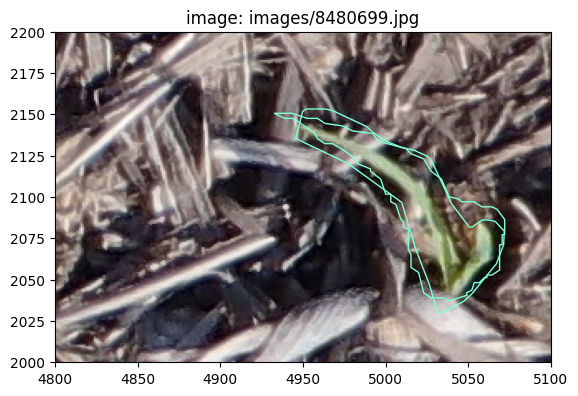

In [46]:
# EXAMPLE - DISPLAY ALL DL POLYGONS ON FULL IMAGE

# example_json_path = "data/dataloop_jsons/6415975.json"
# example_image_id = 6415975

# example_json_path = np.random.choice(jsons_paths_list)
# example_image_id = int(os.path.basename(example_json_path).replace(".json", ""))
# example_image_id = 9143815

example_image_id = 8480699
example_json_path = os.path.join(annotation_local_path, "json", f"{example_image_id}.json")


with open(example_json_path) as file:
    example_data = json.load(file)

example_polygon_coordinates = example_data['annotations'][0]['coordinates']

im_path = env.download_image(int(example_image_id))
image = io.imread(im_path)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

num_images = len(example_data['annotations'])
num_rows = (num_images + 2) // 3  # Divide and round up
num_cols = min(num_images, 3)


# fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20))
fig, ax = plt.subplots()
ax.imshow(image)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
for i in range(len(example_data['annotations'])):
    # row_index = i // num_cols
    # col_index = i % num_cols
    # ax = axs[row_index, col_index]
    # ax = axs[i]
    x_values = [coord['x'] for coord in example_data['annotations'][i]['coordinates'][0]]
    y_values = [coord['y'] for coord in example_data['annotations'][i]['coordinates'][0]]
    polygon = patches.Polygon(list(zip(x_values, y_values)), closed=True, fill=None, edgecolor='aquamarine')

    ax.add_patch(polygon)

    # ax.set_xlim(0, image.shape[1])
    # ax.set_ylim(0, image.shape[0])
    ax.set_xlim(4800, 5100)
    ax.set_ylim(2000, 2200)
    

    ax.set_title(f"image: {im_path}")


# fig.suptitle(f"Image ID: {example_image_id}")
# fig.tight_layout()
plt.show()

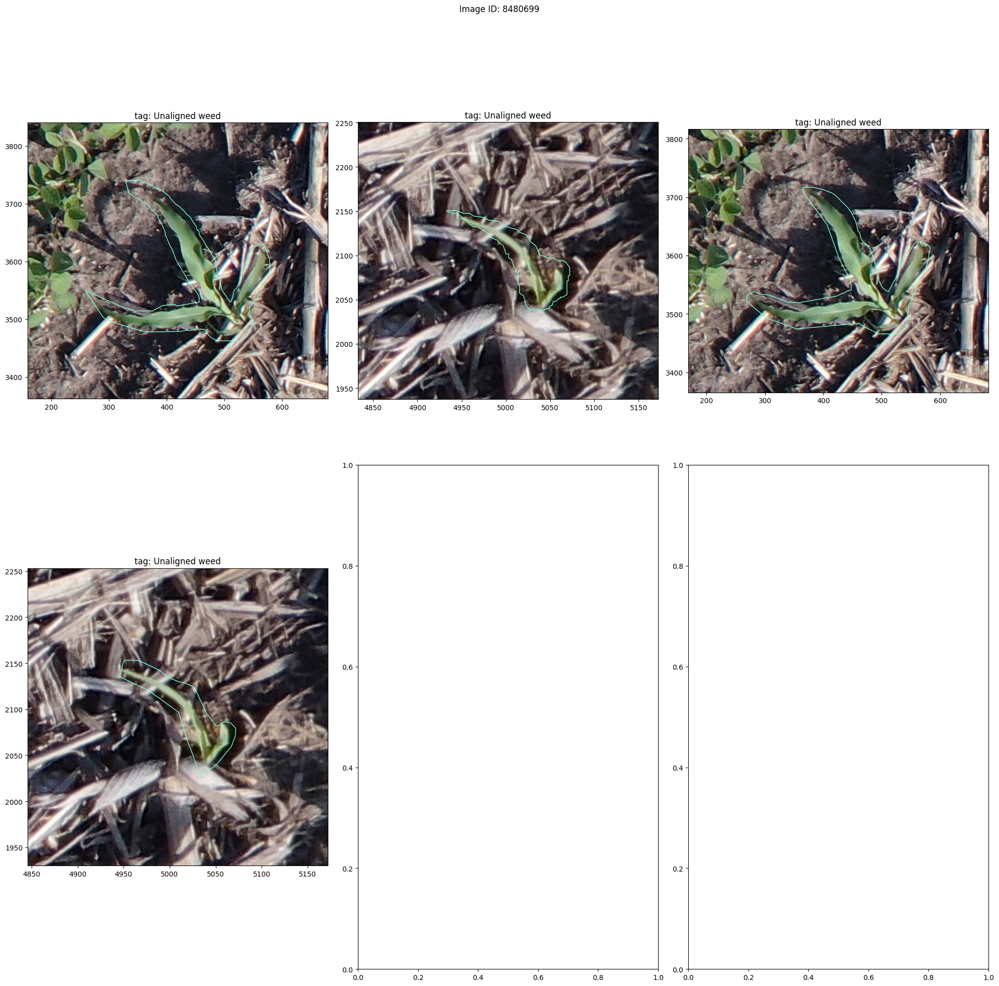

In [44]:
# EXAMPLE - DISPLAY ALL DL POLYGONS ON THE IMAGE

# example_json_path = "data/dataloop_jsons/9143815.json"
# example_image_id = 9143815
# example_json_path = os.path.join(annotation_local_path, "json", f"{example_image_id}.json")

example_json_path = np.random.choice(jsons_paths_list)
example_image_id = int(os.path.basename(example_json_path).replace(".json", ""))
# example_image_id = 9103475

with open(example_json_path) as file:
    example_data = json.load(file)

example_polygon_coordinates = example_data['annotations'][0]['coordinates']

im_path = env.download_image(int(example_image_id))
image = io.imread(im_path)

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

num_images = len(example_data['annotations'])
num_rows = (num_images + 2) // 3  # Divide and round up
num_cols = min(num_images, 3)


fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20))


#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
for i in range(len(example_data['annotations'])):
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axs[row_index, col_index]
    # ax = axs[i]
    x_values = [coord['x'] for coord in example_data['annotations'][i]['coordinates'][0]]
    y_values = [coord['y'] for coord in example_data['annotations'][i]['coordinates'][0]]
    polygon = patches.Polygon(list(zip(x_values, y_values)), closed=True, fill=None, edgecolor='aquamarine')

    ax.imshow(image)
    # Add the polygon patch to the axes
    ax.add_patch(polygon)

    # Set the x and y limits of the axes
    ax.set_xlim(min(x_values)-100, max(x_values)+100)
    ax.set_ylim(min(y_values)-100, max(y_values)+100)

    ax.set_title(f"tag: {example_data['annotations'][i]['label']}")

fig.suptitle(f"Image ID: {example_image_id}", y=0.98)
fig.tight_layout()
plt.show()

In [7]:
# CALCULATE POLYGONS AREA

example_image_id = int(os.path.basename(jsons_paths_list[0]).replace(".json", ""))
im_path = env.download_image(int(example_image_id))
image = io.imread(im_path)
image_shape = image.shape
image_area = image_shape[0] * image_shape[1]

polygons_areas_pixels = {}
polygons_areas = {}


for i in range(len(jsons_paths_list)):
    json_path = jsons_paths_list[i]
    image_id = int(os.path.basename(json_path).replace(".json", ""))
    image_data = images_data[images_data['imageID'] == image_id]

    with open(json_path) as file:
        data = json.load(file)

    image_polygons_areas_pixels = []
    image_polygons_areas = []
    for i in range(len(data['annotations'])):
        x_values = [coord['x'] for coord in data['annotations'][i]['coordinates'][0]]
        y_values = [coord['y'] for coord in data['annotations'][i]['coordinates'][0]]
        polygon = patches.Polygon(list(zip(x_values, y_values)), closed=True, fill=None, edgecolor='aquamarine')
        pgon = Polygon(zip(x_values, y_values))
        image_polygons_areas_pixels.append(pgon.area)
        image_polygons_areas.append((pgon.area/image_area)* image_data['footprintArea'].values[0])
        
    polygons_areas_pixels[image_id] = image_polygons_areas_pixels
    polygons_areas[image_id] = image_polygons_areas


all_polygons_area_pixels = [item for sublist in polygons_areas_pixels.values() for item in sublist]

all_polygons_area = [item for sublist in polygons_areas.values() for item in sublist]


/usr/local/lib/python3.8/dist-packages/skimage/io/_plugins/imageio_plugin.py:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  return np.asarray(imageio_imread(*args, **kwargs))


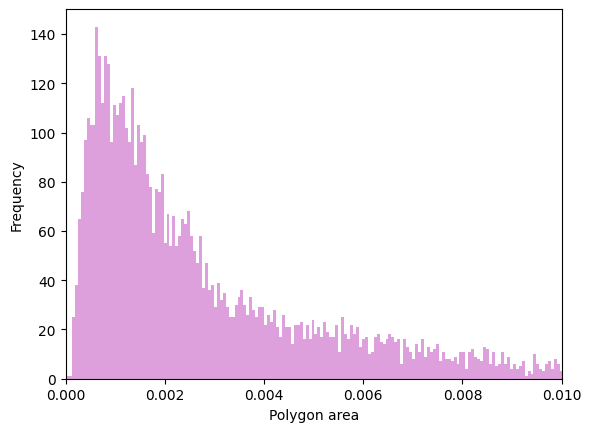

In [46]:
plt.hist(all_polygons_area, bins=10000, color = 'plum')
plt.xlabel('Polygon area')
plt.ylabel('Frequency')
plt.xlim(0, 0.01)
plt.show()

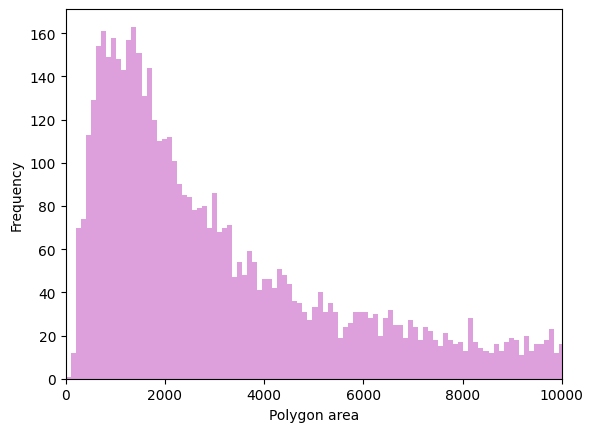

In [42]:
plt.hist(all_polygons_area_pixels, bins=10000, color = 'plum')
plt.xlabel('Polygon area')
plt.ylabel('Frequency')
# plt.xlim(0, 10000)
plt.show()

In [6]:
plt.hist(all_polygons_area_pixels, bins=10000, color = 'plum')
plt.xlabel('Polygon area')
plt.ylabel('Frequency')
# plt.xlim(0, 10000)
plt.show()

NameError: name 'all_polygons_area_pixels' is not defined

In [2]:
images_df = pd.read_csv(os.path.join(DATA_DIR, "weeds_images_df_light.csv"))
images_data = images_df[images_df['imageID'].isin(image_ids)]


Zoom image id: 10119470


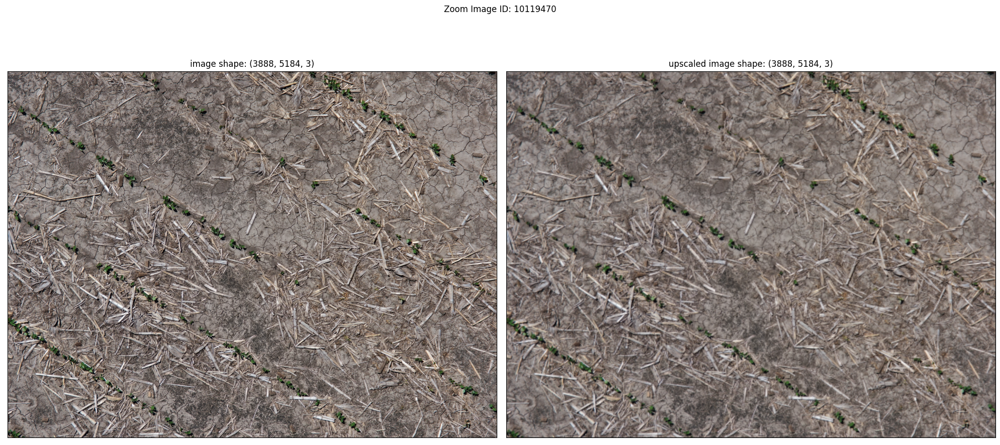

In [84]:
# DISPLAY ONE COUPLE - ZOOM AND WIDE IMAGES

from skimage.filters import gaussian
import skimage.measure

def crop_image(im, n = 8):
    # x_shift = 0
    # y_shift = 0

    x_shift = -30
    y_shift = 30

    im_width = im.shape[0]
    im_height = im.shape[1]

    crop_width = im_width // n
    crop_height = im_height // n

    left = (im_width - crop_width) // 2 + x_shift
    top = (im_height - crop_height) // 2 + y_shift
    right = left + crop_width + x_shift
    bottom = top + crop_height + y_shift

    cropped_image = im[left:right, top:bottom]
    # plt.imshow(cropped_image)
    return cropped_image

# example_image_id = 5225338
# example_image_id = 10118762
# example_image_id = 6941456
# example_image_id = 6500648
# example_image_id = 7751232
# example_image_id = 8827645
# example_image_id = 8432396
# example_image_id = 7850979



print(f"Zoom image id: {example_image_id}")


im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)
wide_image_id = env.eti_api.get_matching_wide_images([example_image_id])
wide_im_path = env.download_image(int(wide_image_id[0]))
wide_image = io.imread(wide_im_path)
cropped_wide_image = crop_image(wide_image)
# blurred_image = gaussian(image, sigma=2, multichannel=True)
# blurred_image = skimage.measure.block_reduce(image, (2,2,1), np.max)
blurred_image = skimage.measure.block_reduce(image, (8,8,1), np.mean).astype(np.uint8)


fig, axes = plt.subplots(nrows=1, ncols=2)
axes[0].imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[0].title.set_text(f'image shape: {image.shape}')

axes[1].imshow(upscaled_image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[1].title.set_text(f'upscaled image shape: {upscaled_image.shape}')


# axes[1].imshow(cropped_wide_image, extent=[0, image.shape[1], 0, image.shape[0]])
# axes[1].title.set_text(f'cropped_wide_image shape: {wide_image.shape}')


for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_size_inches(20, 10)
plt.suptitle(f"Zoom Image ID: {example_image_id}")
plt.tight_layout()
plt.show()

Zoom image id: 10119470


/usr/local/lib/python3.8/dist-packages/skimage/util/dtype.py:226: DeprecationWarning: Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.
  dtypeobj_out = np.dtype(dtype)


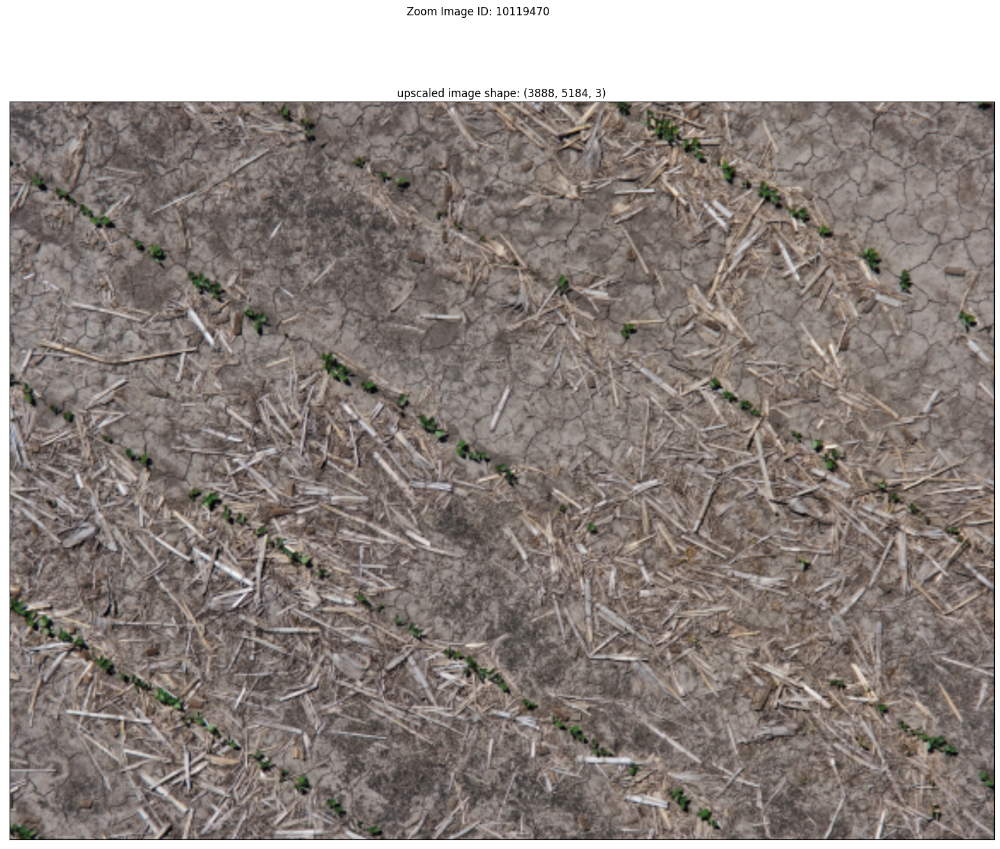

In [81]:
# DISPLAY ONE IMAGE - REGULAR OR BLURRED
from skimage.transform import resize
from skimage.filters import gaussian
import skimage.measure

# example_image_id = 5225338
# example_image_id = 10118762
# example_image_id = 6941456
# example_image_id = 6500648



print(f"Zoom image id: {example_image_id}")


im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)

blurred_image = skimage.measure.block_reduce(image, (9,9,1), np.mean).astype(np.uint8)
upscaled_image = resize(blurred_image, (image.shape[0], image.shape[1]), mode='constant', anti_aliasing=False)

fig, ax = plt.subplots(nrows=1, ncols=1)
ax.imshow(upscaled_image, extent=[0, image.shape[1], 0, image.shape[0]])
ax.title.set_text(f'upscaled image shape: {upscaled_image.shape}')
# ax.imshow(blurred_image, extent=[0, image.shape[1], 0, image.shape[0]])
# ax.title.set_text(f'blurred image shape: {blurred_image.shape}')

ax.set_xticks([])
ax.set_yticks([])

fig.set_size_inches(30, 15)
plt.suptitle(f"Zoom Image ID: {example_image_id}")
# plt.tight_layout()
plt.show()